<a href="https://colab.research.google.com/github/mkdib1/University_PWs/blob/main/ImageProcessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import zipfile
import os
from google.colab import drive

import numpy as np
import matplotlib.pyplot as plt

from skimage import io
from skimage import transform
from skimage import filters
from skimage import color

# Questo è un setting in cui di default settiamo una certa grandezza dell'immagine
# da plottare
plt.rcParams['figure.figsize'] = [15, 5]

In [ ]:
drive.mount('/content/drive')
img_path = '/content/drive/MyDrive/Images'

Mounted at /content/drive


## Loading images

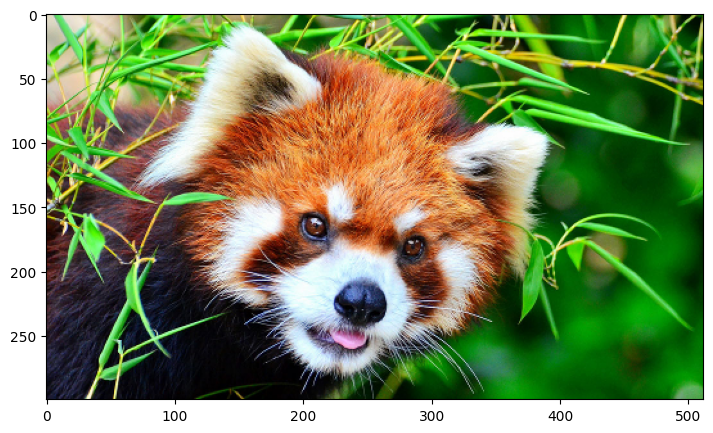

In [ ]:
# reading image from path
rp = io.imread(os.path.join(img_path, 'redpanda.png'))

# showing the image
plt.imshow(rp); plt.show()

In [ ]:
# studying 'rp' object
print(type(rp))
print(rp.shape)

<class 'numpy.ndarray'>
(300, 512, 4)


Come si nota:
* l'immagine è codificata come array di numpy, pertanto non è altro che un set di numeri reali;
* tale array è 3D, le cui dimensioni rappresentano: lunghezza, larghezza e canali-colore. Quest'ultimo a differenza di quanto ci si aspettasse, ossia i 3 rgb, ha come valore **4**: questo perchè è contenuto anche l'**alpha-channel**. Esso è un elemento degli oggetti png, e codifica il livello di opacità. Vediamo come funziona:

  *   se il valore è massimo, allora lo specifico pixel viene mostrato come combinazione della tripletta rgb;
  *   se il valore è prossimo allo zero, allora viene mostrato ciò che c'è sullo sfondo di quel pixel. Nel nostro caso, sarebbe come se fosse predominante il colore del notebook di colab. PS: nell'immagine corrente, tale livello di opacità è massimo per tutti i pixel



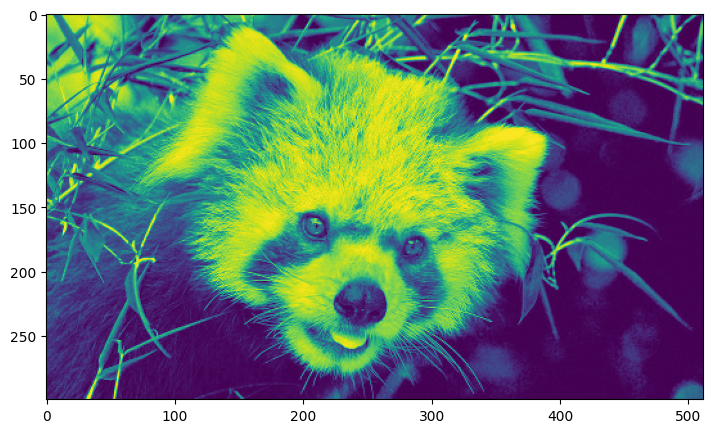

In [ ]:
# Plottiamo l'immagine specificando un singolo canale-colore
plt.imshow(rp[:, :, 0]); plt.show()

Qui l'immagine si dice essere un'immagine a **falsi colori**.
In particolare, viene mostrata come insieme di pixel aventi valori massimi per il canale 'rosso-lime' e minimi per blu scuro e verde

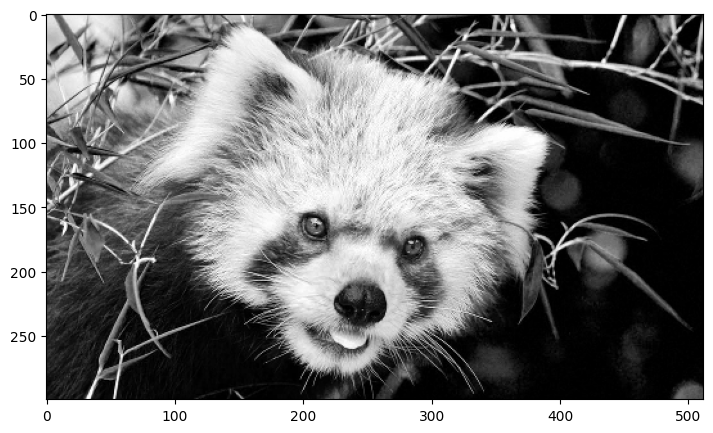

In [ ]:
# Specifichiamo una specifica color map, in qst caso grigio
# Viene mostrata l'immagine i cui pixel hanno valori alti per il nero e bassi
# per il bianco
plt.imshow(rp[:, :, 0], cmap='gray'); plt.show()

Text(0.5, 1.0, 'Blue')

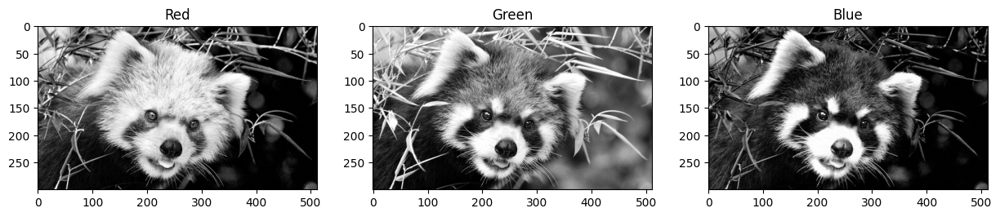

In [ ]:
# Plottiamo l'immagine su tutti e 3 i canali colore
plt.subplot(1, 3, 1); plt.imshow(rp[:, :, 0], cmap='gray'); plt.title('Red')
plt.subplot(1, 3, 2); plt.imshow(rp[:, :, 1], cmap='gray'); plt.title('Green')
plt.subplot(1, 3, 3); plt.imshow(rp[:, :, 2], cmap='gray'); plt.title('Blue')


Text(0.5, 1.0, 'Blue')

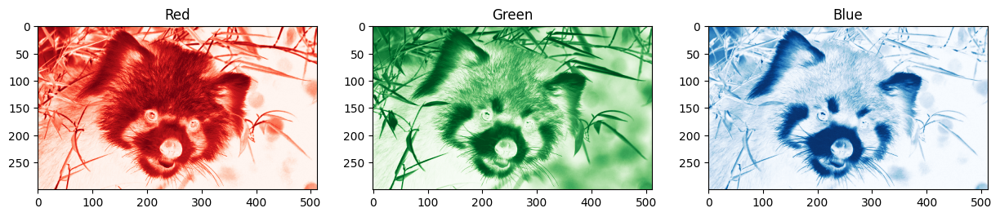

In [ ]:
# Plottiamo l'immagine su tutti e 3 i canali colore
plt.subplot(1, 3, 1); plt.imshow(rp[:, :, 0], cmap='Reds'); plt.title('Red')
plt.subplot(1, 3, 2); plt.imshow(rp[:, :, 1], cmap='Greens'); plt.title('Green')
plt.subplot(1, 3, 3); plt.imshow(rp[:, :, 2], cmap='Blues'); plt.title('Blue')


Le due visualizzazioni sono solo alternative diverse per rappresentare i differenti canali colore, presi singolarmente.<br>
Nel primo caso mappiamo su scala di grigio, nel secondo mappiamo su una scala di uno specifico colore.

Alcune trasformazioni sulle immagini sono definite lavorando su un singolo canale colore. Prendiamo come riferimento la scala di grigi

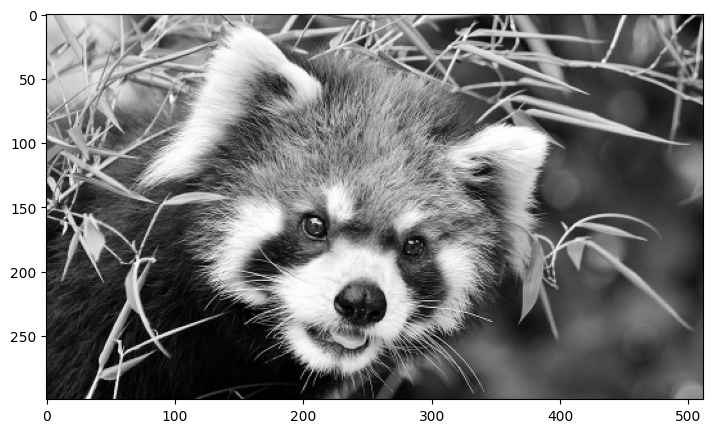

In [ ]:
# Loading image in greyscale
rp_gray = io.imread(os.path.join(img_path, 'redpanda.png'), as_gray=True) # specif 'as_gray'=True
plt.imshow(rp_gray, cmap='gray'); plt.show()

La scala di grigio è stata costruita come **combinazione lineare dei 3 canali rgb**, dove in questo caso intendiamo "una media pesata".
C'è però maggior peso per il canale **Verde**, questo per rispecchiare le caratteristiche dell'occhio umano, maggiormente sensibile in condizioni di luce al colore verde rispetto al blu e rosso, che invece appaiono più sensibili in condizioni di luce minima

Specifichiamo adesso il parametro **clim**.
Per semplificare, è una normalizzazione dei valori dei pixel, in cui il nero è mappato al valore 0, e il bianco all'1.
In assenza di questa specifica, il nero sarebbe stato mappato al valore più basso trovato nella matrice dei numeri reali che definiscono l'immagine, e il bianco al valore più alto.
Questo significa che se avessimo valori al di fuori di [0,1], essi verranno aggiornati con valori dei limiti (0 o 1)

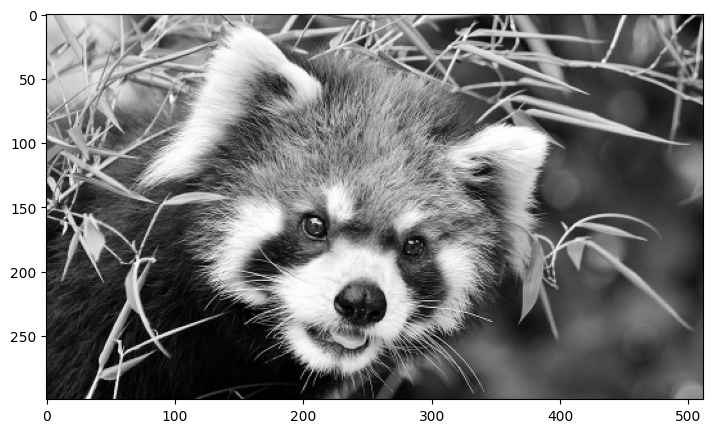

In [ ]:
plt.imshow(rp_gray, cmap='gray'); plt.clim(0, 1); plt.show()

## Elaborazione immagine 'church.png'

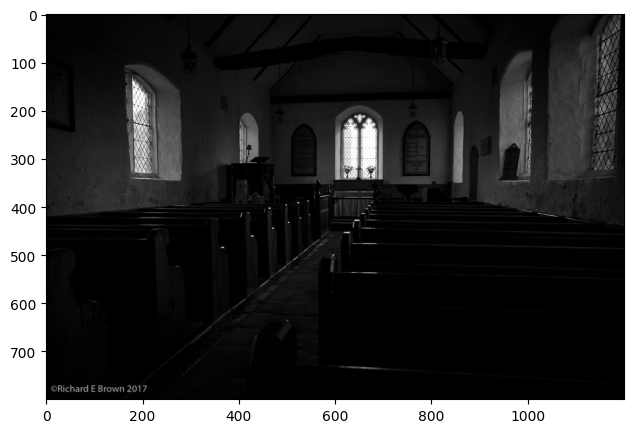

In [ ]:
# load img
ch = io.imread(os.path.join(img_path, 'church.jpg'), as_gray=True)

# plot
plt.imshow(ch, cmap='gray'); plt.clim(0, 1); plt.show()

Vogliamo schiarire l'immagine.
Una prima strategia ovvia ci può portare a sommare ai valori della matrice, un certo scalare (ricordiamo che più si alzano i valori, più il pixel viene mappato verso il bianco).<br>

Scegliamo dunque di aggiungere **0.3**

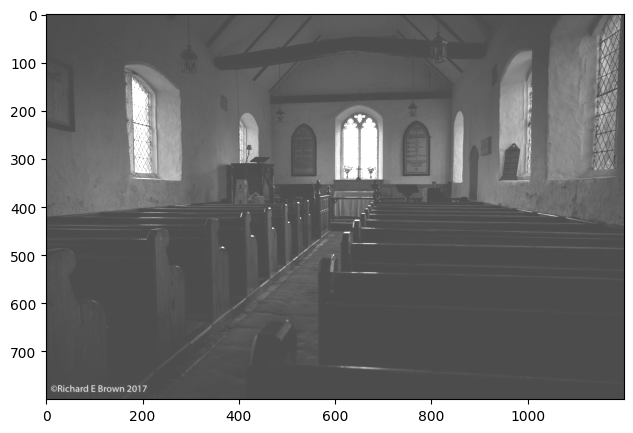

In [ ]:
plt.imshow(ch+0.3, cmap='gray'); plt.clim(0, 1); plt.show()

*** Per tutto ciò che riporterò, vedere le simulazioni con DESMOS***

In questo caso, abbiamo apportato una semplice traslazione y = x + 0.3.
Il problema è (vedere DESMOS), che in y, tutto ciò che è x > 0.7 viene mappato ad 1, facendoci perdere quindi tutta l'informazione compresa tra 0.7 e 1 dei valori di x.
Inoltre, avendo traslato, il valore di x=0 ha come immagine y=0.3, e pertanto tutto ciò che c'è nel dominio 0 < y < 0.3 è stato perso.
Tutto ciò si traduce nell'aver perso le sfumature scure prossime allo 0, e quelle medio-alte che diventano "subito" 1

Verrebbe quindi da provare un'altra soluzione, ossia moltiplicare per un certo scalare. In questo caso per ottenere l'effetto, tale scalare deve essere > 1.<br>
Scegliamone uno abbastanza grande, tipo 4

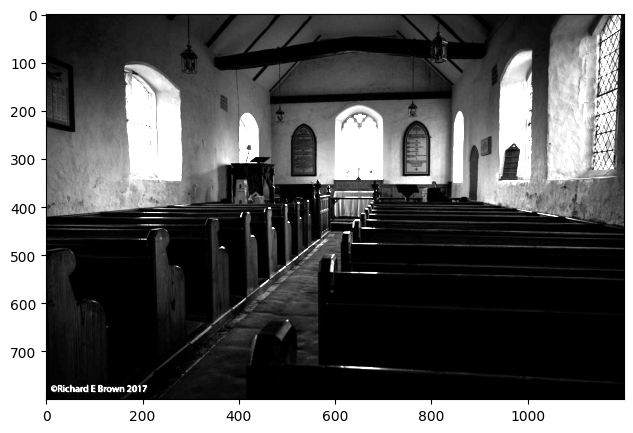

In [ ]:
plt.imshow(ch*4.0, cmap='gray'); plt.clim(0, 1); plt.show()

Nonostante abbiamo "recuperato" punti del dominio iniziale che avevamo perso prima, abbiamo ancora e anzi in modo più accentuato l'effetto "smoothing" dei valori maggiori di un certo X, che vengono "subito" mappati ad Y=1.<br>
L'effetto è quello di ottenere pixel neri per valori iniziali medio-alti che non erano neri.<br>

Si può dimostrare che, il giusto trade-off che vogliamo, ossia fare in modo che la curva di "schiarimento" sia alta all'inizio per poi "rallentare" verso i valori alti lo si ottiene con la **funzione potenza** (provare con DESMOS).<br>
Il risultato è il migliore che si possa ottenere, con l'effetto "schiarimento graduale" dei pixel.<br>
Tale effetto è detto **gamma-correction**.

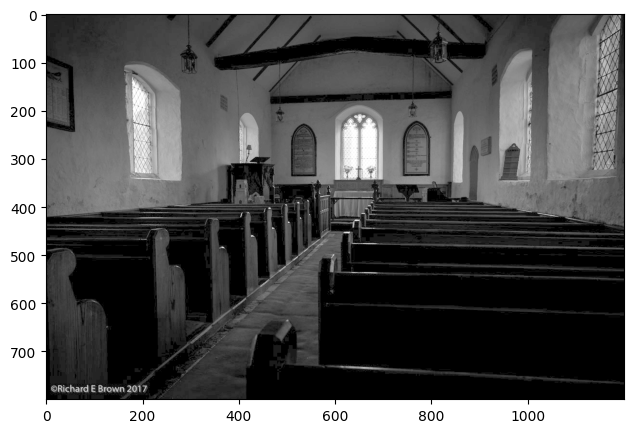

In [ ]:
plt.imshow(ch**0.4, cmap='gray'); plt.clim(0, 1); plt.show()

**ATTENZIONE**: la gamma correction va usata solo se i dati sono stati scalati tra [0,1]. In DESMOS è possibile vedere il comportamento della gamma correction, in cui si nota come solamente per i primi valori di X, le immagini in Y hanno uno "schiarimento" superiore alla funzione identità.<br>
Al crescere dei valori di X tuttavia, Y cresce in maniera molto ma molto lenta. Si potrebbe dire che si appiattisce in maniera asintotica al valore 10. Questo significa che oltre questo valore, tutti i pixel rimnagono scuri.

## Resizing

In [ ]:
# Starting shape of the img
ch.shape

(800, 1200)

Vogliamo  rimpicciolire l'immagine.<br>
Definiamo prima il parametro di "rimpicciolimento", applicando un cast di tipo

In [ ]:
new_shape = (int(ch.shape[0]*0.2), int(ch.shape[1]*0.2))
new_shape

(160, 240)

In [ ]:
# using 'transform.resize'
ch_small = transform.resize(ch, new_shape)

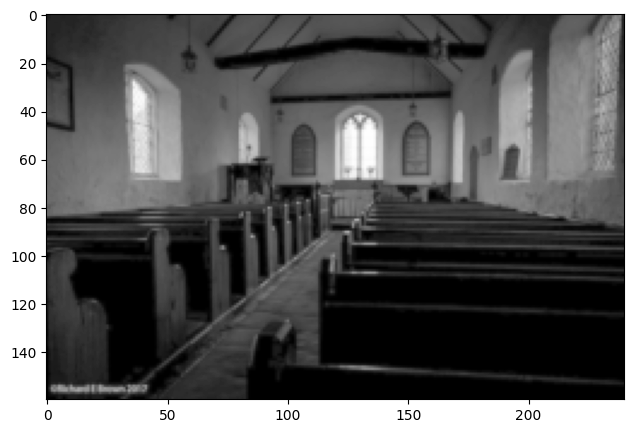

In [ ]:
plt.imshow(ch_small**0.4, cmap='gray'); plt.clim(0, 1); plt.show()

Anche se colab mostra le immagini alla stessa grandezza, per cui può venire il dubbio che non ci sia stato alcun reshape, in realtà vediamo che sugli assi i valori sono più ridotti. Ma si nota anche che l'immagine è sfocata, derivante dal fatto che alcuni pixel si sono persi.<br>
Si tratta più che altro di un comportamento insito in colab, quello di plottare le immagini tutte alla stessa dimesione, ma se la esportiamo ala vedremmo piccola.

## Overlapping

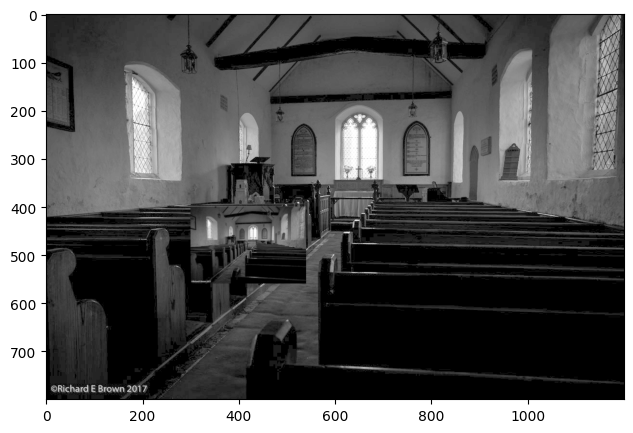

In [ ]:
# Overlapping ch_small into the original one
ch_overl = ch.copy() # first i make a copy

# I chose a length starting point (400) from which pixels of the original img
# would be overlapped by ch_small. I do the same for the amplitude (300)
ch_overl[400:400+ch_small.shape[0], 300:300+ch_small.shape[1]] = ch_small

# Applying gamma-correction
plt.imshow(ch_overl**0.4, cmap='gray'); plt.clim(0, 1); plt.show()

## Local transformations

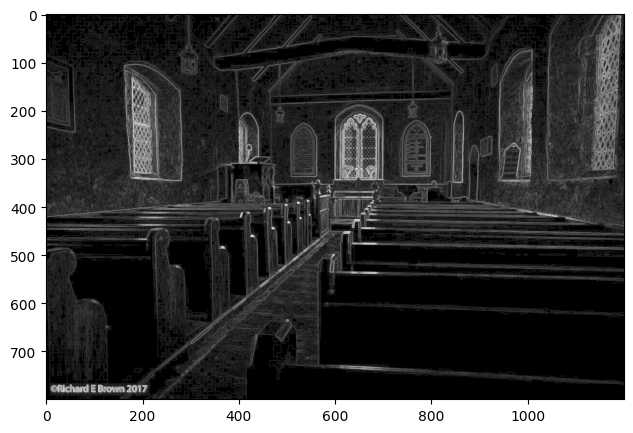

In [ ]:
# using class 'filters' to recall predefined filters like 'sobel'
ch_edge = filters.sobel(ch) # it is used for extracting edges from images
plt.imshow(ch_edge**0.4, cmap='gray'); plt.show()

L'engine di 'sobel' è una convoluzione (matrice maschera) che viene fatta scorrere sull'immagine originale (matrice) e che annulla i pixel centrali (assegna 0), mentre moltiplica i pixel a sx per valori positivi e a dx per valori negativi.<br>
In questo modo, l'immagine diventa molto sensibile ai bruschi cambi di luminosità, e gli edge per definizione sono proprio questo.<br>
Pertanto si ottiene una loro estrazione.

## Color management

Riprendiamo l'immagine redpanda

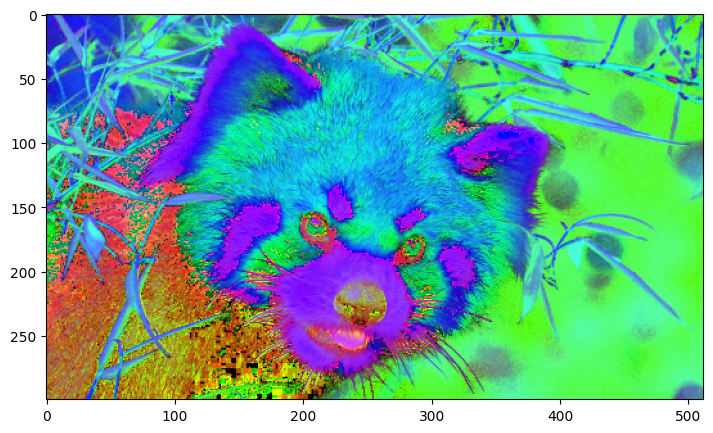

In [ ]:
# transforming it into 'hsv' images
rp_hsv = color.rgb2hsv(rp[:,:,0:3]) # considering 3 out of 4 color-channel
plt.imshow(rp_hsv); plt.show()

L'immagine **hsv**, che si ottiene a partire dalla classica **rgb** è un'immagine che riporta le info di:
* **hue** --> dove ci stiamo collocando nella 'color-wheel', ovvero qual è la tinta (colore) di quel pixel. Qui si prende come riferimento appunto una color-wheel, che assegna numeri reali a ciascuna tinta.
* **saturation** --> quanto ogni pixel è distante dal grigio: valori bassi di saturazione indicano forte vicinanza al grigio, mentre valori alti indicano che siamo vicini ai valori molto scuri o molto chiari
* **value** --> valore di luminosità del pixel: quanta luce viene emessa da ciascuno

Text(0.5, 1.0, 'Value')

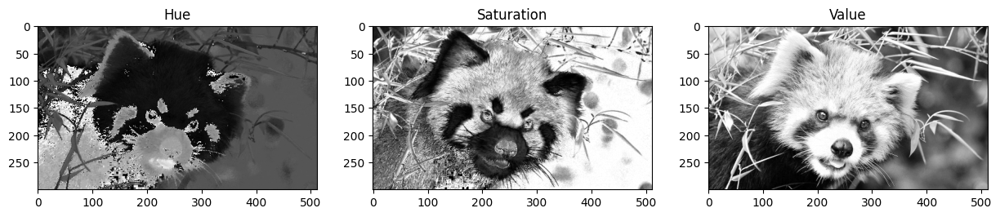

In [ ]:
# Plot each of the 3 component, using gray map
plt.subplot(1, 3, 1); plt.imshow(rp_hsv[:, :, 0], cmap='gray'); plt.title('Hue')
plt.subplot(1, 3, 2); plt.imshow(rp_hsv[:, :, 1], cmap='gray'); plt.title('Saturation')
plt.subplot(1, 3, 3); plt.imshow(rp_hsv[:, :, 2], cmap='gray'); plt.title('Value')


Chiaramente la ripercussione di ciò è che si può lavorare su ognuna di queste feature, ad esempio aumentando o diminuendo la saturazione, o la luminosità, etc.

## Y-CbCr

Si tratta di una codifica che segue la seguente logica:
* Canale **Y** --> è una ulteriore interpretazione di luminosità. Viene restituita un'immagine simile alla n. 3 dei plot sopra (value);
* Canale **Cb** --> mappa i pixel a seconda della distanza dal blu:
  * Valori bassi = il pixel è simile al blu;
  * Valori alti = pixel è simile al colore opposto al blu, ossia giallo;
* Canale **Cr** --> mappa i pixel a seconda della distanza dal red:
  * Valori bassi = il pixel è simile al red;
  * Valori alti = pixel è simile al colore opposto al red, ossia verde;

Tale spazio colore è usata nella compressione delle immaigni, dato che sfrutta molti meno bit. Nella ricostruzione dell'immagine viene usato lo spazio YCbCr.<br>
Nello specifico:
  * vengono compresse "molto" le componenti chroma-channel (Cb, Cr);
  * viene compressa "poco" la componente Y di luminosità.

Le info di compressione dei chroma-channels vengono sfruttate per ricostruire l'immagine in fase di decompressione.

# ASSEIGNEMENT

1. Scegliere immagine custom
2. Convertirla nello spazio colore YCbCr
3. Blurrarla utilizzando un filtro gaussiano nei canali Cb e Cr
4. Plottare con 3 subplot i canali Y, Cb-blurrato e Cr-blurrato
5. Ricostruire l'immagine RGB partendo dalla compressione del punto 4
6. Applicare il filtro gaussiano al canale Y, lasciando intatti Cb e Cr
7. Visualizzare l'immagine secondo le caratteristiche del punto 6
8. Ricostruire l'immagine partendo dalla compressione fatta nel punto 6

9. Fare più prove con diversi valori del filtro gaussiano

In [1]:
import zipfile
import os
from google.colab import drive

import numpy as np
import matplotlib.pyplot as plt

from skimage import io
from skimage import transform
from skimage import filters
from skimage import color

plt.rcParams['figure.figsize'] = [15, 5]

In [2]:
drive.mount('/content/drive')
img_path = '/content/drive/MyDrive/Images'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import skimage as ski
mn_rgb = ski.io.imread(os.path.join(img_path, 'mountains.jpg'))
mn_ycbcr = ski.color.convert_colorspace(mn_rgb, 'RGB', 'YCbCr')

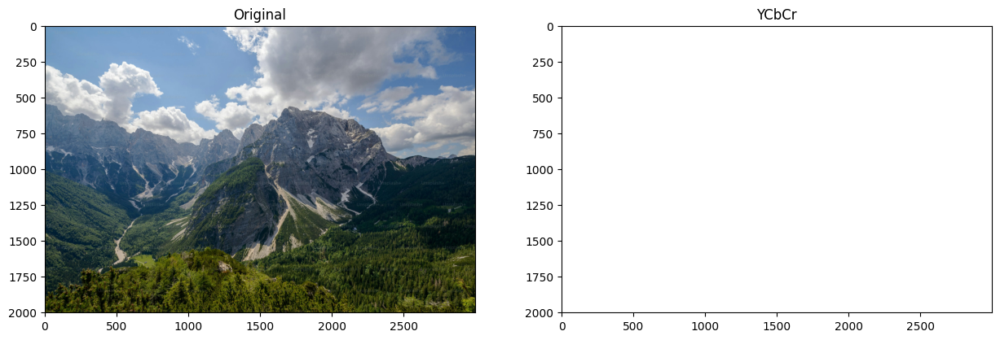

In [4]:
plt.subplot(1, 2, 1); plt.imshow(mn_rgb); plt.title('Original')
plt.subplot(1, 2, 2); plt.imshow(mn_ycbcr); plt.title('YCbCr')
plt.show()

In [5]:
print("Shape of rgb img: ", mn_rgb.shape)
print("Shape of ycbcr img: ", mn_ycbcr.shape)


Shape of rgb img:  (2002, 3000, 3)
Shape of ycbcr img:  (2002, 3000, 3)


In [6]:
onlyCb_sk = mn_ycbcr.copy()
onlyCr_sk = mn_ycbcr.copy()

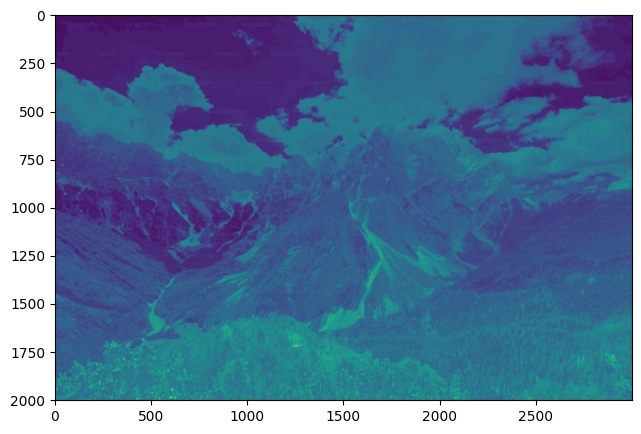

In [20]:
plt.imshow(mn_ycbcr[:,:,2]);plt.show()

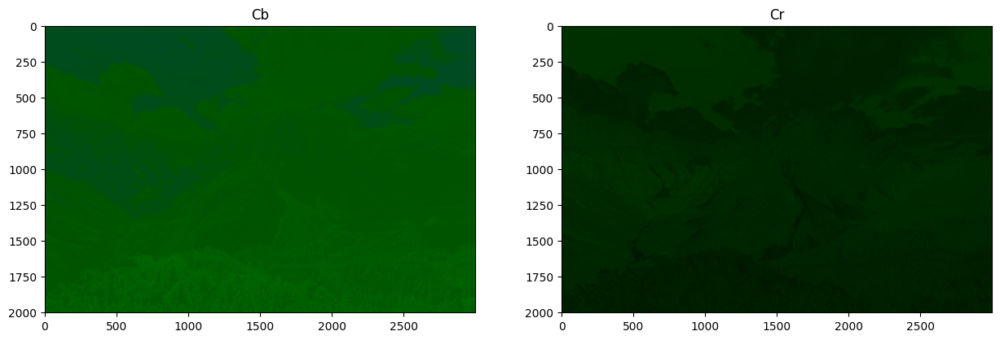

In [21]:
# supposing Y = 0, Cb = 1, Cr = 2
onlyCb_sk[:, :, 0] = 0
onlyCb_sk[:, :, 2] = 0

onlyCr_sk[:, :, 0] = 0
onlyCr_sk[:, :, 1] = 0

onlyCb_sk_rgb = ski.color.convert_colorspace(onlyCb_sk, 'YCbCr', 'RGB')
onlyCr_sk_rgb = ski.color.convert_colorspace(onlyCr_sk, 'YCbCr', 'RGB')

plt.subplot(1, 2, 1); plt.imshow(onlyCb_sk_rgb); plt.title('Cb')
plt.subplot(1, 2, 2); plt.imshow(onlyCr_sk_rgb); plt.title('Cr')
plt.show()

Text(0.5, 1.0, 'Cr')

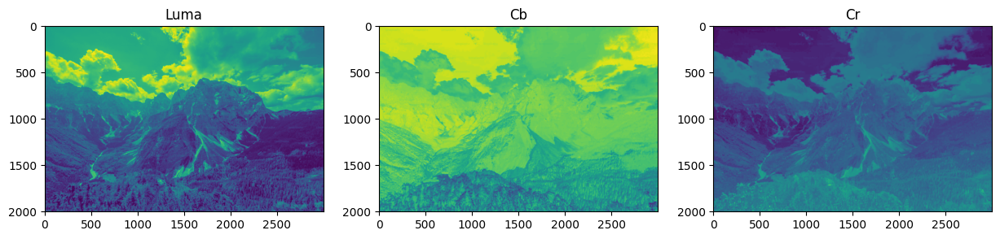

In [8]:
plt.subplot(1, 3, 1); plt.imshow(mn_ycbcr[:, :, 0]); plt.title('Luma')
plt.subplot(1, 3, 2); plt.imshow(mn_ycbcr[:, :, 1]); plt.title('Cb')
plt.subplot(1, 3, 3); plt.imshow(mn_ycbcr[:, :, 2]); plt.title('Cr')

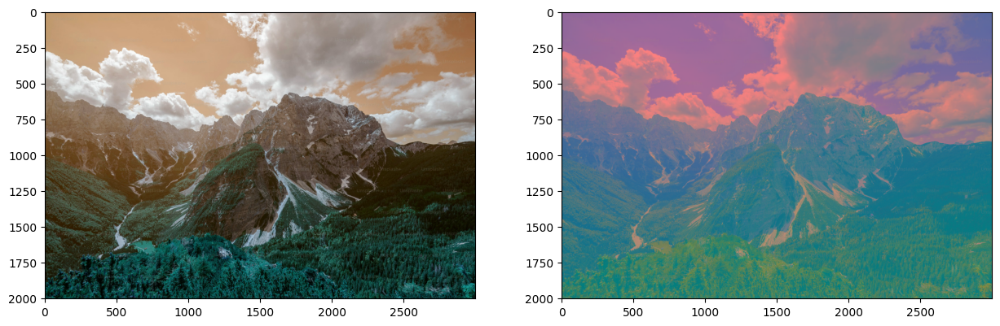

In [9]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

plt.rcParams['figure.figsize'] = [15, 5]
img = cv2.imread(os.path.join(img_path, 'mountains.jpg'))
img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
plt.subplot(121),plt.imshow(img)
plt.subplot(122),plt.imshow(img_ycrcb)
plt.show()

In [10]:
B, G, R = cv2.split(img)
Y, Cr, Cb = cv2.split(img_ycrcb)

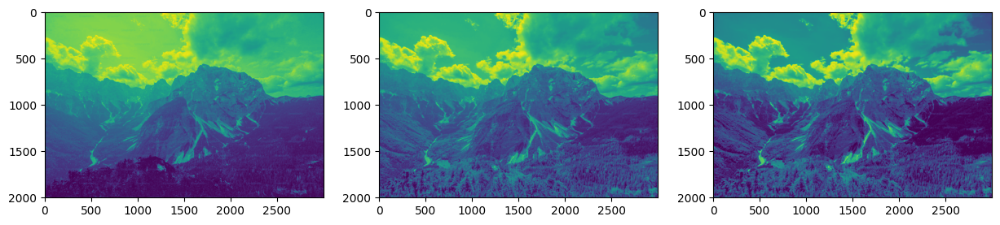

In [11]:
plt.subplot(1,3,1),plt.imshow(B)
plt.subplot(1,3,2),plt.imshow(G)
plt.subplot(1,3,3),plt.imshow(R)
plt.show()

Text(0.5, 1.0, 'Cb')

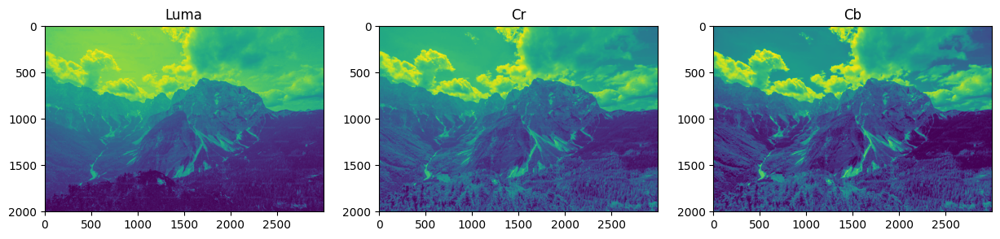

In [12]:
plt.subplot(1, 3, 1); plt.imshow(img[:, :, 0]); plt.title('Luma')
plt.subplot(1, 3, 2); plt.imshow(img[:, :, 1]); plt.title('Cr')
plt.subplot(1, 3, 3); plt.imshow(img[:, :, 2]); plt.title('Cb')

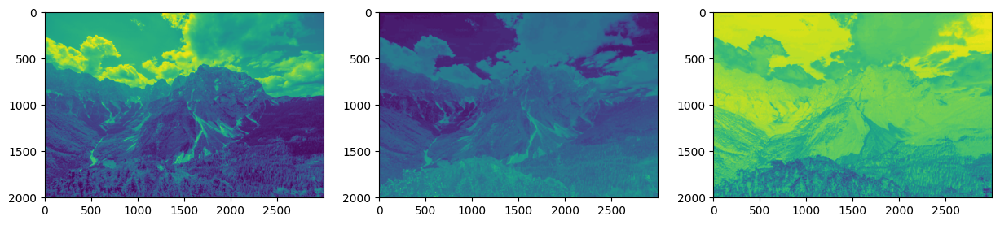

In [13]:
plt.subplot(1,3,1),plt.imshow(Y)
plt.subplot(1,3,2),plt.imshow(Cr)
plt.subplot(1,3,3),plt.imshow(Cb)
plt.show()

In [14]:
'''
import cv2
import numpy as np

img = cv2.imread('rgb.png')  # Read input image in BGR format

imgYCrCB = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)  # Convert RGB to YCrCb (Cb appiles V, and Cr applies U).

Y, Cr, Cb = cv2.split(imgYCrCB)

# Fill Y and Cb with 128 (Y level is middle gray, and Cb is "neutralized").
onlyCr = imgYCrCB.copy()
onlyCr[:, :, 0] = 128
onlyCr[:, :, 2] = 128
onlyCr_as_bgr = cv2.cvtColor(onlyCr, cv2.COLOR_YCrCb2BGR)  # Convert to BGR - used for display as false color

# Fill Y and Cr with 128 (Y level is middle gray, and Cr is "neutralized").
onlyCb = imgYCrCB.copy()
onlyCb[:, :, 0] = 128
onlyCb[:, :, 1] = 128
onlyCb_as_bgr = cv2.cvtColor(onlyCb, cv2.COLOR_YCrCb2BGR)  # Convert to BGR - used for display as false color


cv2.imshow('img', img)
cv2.imshow('Y', Y)
cv2.imshow('onlyCb_as_bgr', onlyCb_as_bgr)
cv2.imshow('onlyCr_as_bgr', onlyCr_as_bgr)
cv2.waitKey()
cv2.destroyAllWindows()

cv2.imwrite('Y.png', Y)
cv2.imwrite('onlyCb_as_bgr.png', onlyCb_as_bgr)
cv2.imwrite('onlyCr_as_bgr.png', onlyCr_as_bgr)
'''

'\nimport cv2\nimport numpy as np\n\nimg = cv2.imread(\'rgb.png\')  # Read input image in BGR format\n\nimgYCrCB = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)  # Convert RGB to YCrCb (Cb appiles V, and Cr applies U).\n\nY, Cr, Cb = cv2.split(imgYCrCB)\n\n# Fill Y and Cb with 128 (Y level is middle gray, and Cb is "neutralized").\nonlyCr = imgYCrCB.copy()\nonlyCr[:, :, 0] = 128\nonlyCr[:, :, 2] = 128\nonlyCr_as_bgr = cv2.cvtColor(onlyCr, cv2.COLOR_YCrCb2BGR)  # Convert to BGR - used for display as false color\n\n# Fill Y and Cr with 128 (Y level is middle gray, and Cr is "neutralized").\nonlyCb = imgYCrCB.copy()\nonlyCb[:, :, 0] = 128\nonlyCb[:, :, 1] = 128\nonlyCb_as_bgr = cv2.cvtColor(onlyCb, cv2.COLOR_YCrCb2BGR)  # Convert to BGR - used for display as false color\n\n\ncv2.imshow(\'img\', img)\ncv2.imshow(\'Y\', Y)\ncv2.imshow(\'onlyCb_as_bgr\', onlyCb_as_bgr)\ncv2.imshow(\'onlyCr_as_bgr\', onlyCr_as_bgr)\ncv2.waitKey()\ncv2.destroyAllWindows()\n\ncv2.imwrite(\'Y.png\', Y)\ncv2.imwrite(\'o

In [15]:
onlyCr = img_ycrcb.copy()
onlyCr[:, :, 0] = 128
onlyCr[:, :, 2] = 128
onlyCr_as_bgr = cv2.cvtColor(onlyCr, cv2.COLOR_YCrCb2BGR)


onlyCb = img_ycrcb.copy()
onlyCb[:, :, 0] = 128
onlyCb[:, :, 1] = 128
onlyCb_as_bgr = cv2.cvtColor(onlyCb, cv2.COLOR_YCrCb2BGR)

Text(0.5, 1.0, 'Cb')

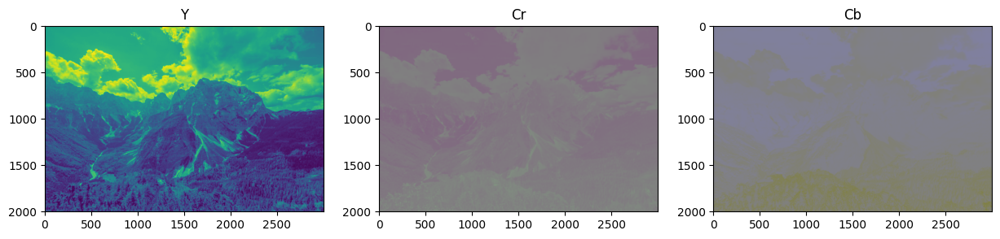

In [16]:
plt.subplot(1, 3, 1); plt.imshow(Y); plt.title('Y')
plt.subplot(1, 3, 2); plt.imshow(onlyCr); plt.title('Cr')
plt.subplot(1, 3, 3); plt.imshow(onlyCb); plt.title('Cb')